In [148]:
###draft workshop script part 1: exploring the data

import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt

import networkx as nx
import itertools
import random

In [142]:
##import the data
cybernetics_data = pd.read_csv ('../CTC_Machine-Generated-Data.csv')
print (cybernetics_data.head(5))

                                     Master Filename Level of Description  \
0  1106834_2_LogicoPhilosophicalCommentsSelfOrg_1...                 File   
1          1106834_2_PresentTheorySwitching_1960.pdf                 File   
2           1106834_2_LinearPropertyFilters_1962.pdf                 File   
3             1106834_2_SelfOrgEnvironments_1960.pdf                 File   
4  1106834_2_RealizationOfBiologicalComputers2_19...                 File   

                                               Title  Date  \
0  TR No. 5: Some Logico: Philosophical Comments ...  1960   
1  TR No. 3: The Present Theory of Switching and ...  1960   
2  TR No. 1 and 2: Linear Property Filters, Alfre...  1962   
3  Von Foerster, H. : "On Self-Organizing Systems...  1960   
4  The Realization of Biological Computers, Quart...  1958   

                                  Scope and Contents  \
0  Biological Computer Laboratory Publications in...   
1  Biological Computer Laboratory Publications in...

In [4]:
##list each column, type of data, and number of unique entries

for i in cybernetics_data.columns:
    print (i)
    print (cybernetics_data[i].dtype)
    print (cybernetics_data[i].nunique())
    print ()

Master Filename
object
629

Level of Description
object
1

Title
object
620

Date
object
237

Scope and Contents
object
5

Creator
object
532

Associated Person (Machine Generated)
object
191

Subject
object
314

Location
object
230

Format of Material
object
3

Language
object
13

Cybernetic Classification (Machine Generated)
object
4

Classification Certainty (Machine Generated)
object
242

Machine-extracted Feature (Machine Generated)
object
382

Overall Sentiment (Machine Generated)
float64
277

Percent Positive Sentiment (Machine Generated)
float64
268

Percent Negative Sentiment (Machine Generated)
float64
192

Percent Neutral Sentiment (Machine Generated)
float64
286

Rights
object
1

Parent Collection
object
5

Repository
object
1

Collection Identifier
object
149



In [7]:
##list all the creators
creator_list = []
for i in cybernetics_data['Creator']:
    if not pd.isna(i):
        creator_list.append(i.split('||'))

creator_list = [item for sublist in creator_list for item in sublist]
creator_set = set(creator_list)
print (len(creator_set))
for i in creator_set:
    print (i)

732
Mercer, Robert A.
Bloom, L.R.
Freedman, David
Iberall, Art
Bordeaux, Janice
Berkner, L.V.
Wheatley, Max D.
Desmedt,  J.E.
Buckley, Walter
Simon, John K.
Looker, Patricia
Geyer, Felix
Waltzawick, Paul
Herrmann, Roy
Miller, W.E.
Kohler,  Wolfgang 
Medley, Doug
Davies, David
Abbott, John A.
Turing, Alan
Aley, Robert J.
Meredith, Patrick
Archibald, Kathleen A.
West, Vincent I.
Russell, Bertrand
Dwyer, Joseph L. III
Chalmers, Bruce
Gunkel, Pat
Ritner, Peter V.
Hahn, Bertha
Callaway, Enoch
Austin, G.M.
Cobb, Stanley
Caianiello, E.R.
Yovits, Marshall C.
Eliot, T. S. (Thomas Stearns)
Bures, J.
Sutton, Robert M.
Alpert, Daniel
Wiseman, H.
Naylor, Gabriella
Blandford, Dick K.
Hobson, E.W.
Mole, Paul
McHale, John
Kalinsky, Morris J.
Amberson, William R.
Martin, W. T.
Phiebig, Albert J.
Miller, David C.
Mackay, Donald
Phillips, Mike
Hilbert, D.
Maturana, Humberto R.
Moulin, Thibault
Levy, P.¬† ¬† ¬† ¬† ¬† ¬† ¬†¬†
Yosida, Kosako
Spencer, Roy C.
Landauer, Rolf
Binder, Robert G.
Cheydleur, Benjam

In [47]:
##make a map
#lat-long data from https://simplemaps.com/data/world-cities
# and from https://simplemaps.com/data/us-cities

world_cities = pd.read_csv ("../worldcities.csv")
us_cities = pd.read_csv ("../uscities.csv")

us_cities


,city,city_ascii,state_id,state_name,county_fips,county_name,lat,lng,population,density,source,military,incorporated,timezone,ranking,zips,id
0,New York,New York,NY,New York,36081,Queens,40.6943,-73.9249,18832416,10943.7,shape,False,True,America/New_York,1,11229 11228 11226 11225 11224 11222 11221 1122...,1840034016
1,Los Angeles,Los Angeles,CA,California,6037,Los Angeles,34.1141,-118.4068,11885717,3165.7,shape,False,True,America/Los_Angeles,1,91367 90291 90293 90292 91316 91311 90035 9003...,1840020491
2,Chicago,Chicago,IL,Illinois,17031,Cook,41.8375,-87.6866,8489066,4590.3,shape,False,True,America/Chicago,1,60018 60649 60641 60640 60643 60642 60645 6064...,1840000494
3,Miami,Miami,FL,Florida,12086,Miami-Dade,25.7840,-80.2101,6113982,4791.1,shape,False,True,America/New_York,1,33128 33129 33125 33126 33127 33149 33144 3314...,1840015149
4,Houston,Houston,TX,Texas,48201,Harris,29.7860,-95.3885,6046392,1386.2,shape,False,True,America/Chicago,1,77069 77068 77061 77060 77063 77062 77065 7706...,1840020925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31249,Mount Wilson,Mount Wilson,NV,Nevada,32017,Lincoln,38.2350,-114.4504,0,2.2,shape,False,True,America/Los_Angeles,5,89043,1840039843
31250,Kohatk,Kohatk,AZ,Arizona,4021,Pinal,32.5781,-112.0032,0,77.3,shape,False,False,America/Phoenix,3,85634,1840022983
31251,Ironville,Ironville,PA,Pennsylvania,42013,Blair,40.6586,-78.2155,0,59.2,shape,False,False,America/New_York,3,16686,1840152922
31252,Newkirk,Newkirk,NM,New Mexico,35019,Guadalupe,35.0635,-104.2715,0,0.0,shape,False,False,America/Denver,3,88417,1840024978


In [48]:
##make columns in map df that match format of data placenames
world_cities['name_id'] = world_cities['city'] + ' (' + world_cities['country']+')'
us_cities['name_id'] = us_cities['city'] + ' (' + us_cities['state_id']+')'

0              New York (NY)
1           Los Angeles (CA)
2               Chicago (IL)
3                 Miami (FL)
4               Houston (TX)
                ...         
31249      Mount Wilson (NV)
31250            Kohatk (AZ)
31251         Ironville (PA)
31252           Newkirk (NM)
31253    Falcon Village (TX)
Name: name_id, Length: 31254, dtype: object

In [50]:
##make a list of places by separating duplicates
place_list = []
for i in cybernetics_data['Location']:
    if not pd.isna(i):
        place_list.append(i.split('||'))

place_list = [item for sublist in place_list for item in sublist]
place_set = set(place_list)
print (len(place_set))
print (place_set)

200
{'Loma Linda (CA)', 'Livermore (CA)', 'Leeds (England)', 'Toronto (Canada)', 'Miami Beach (FL)', 'Tel Aviv (Israel)', 'Ernlagen (Germany)', 'Harlow (England)', 'Ottawa (Canada)', 'Brooklyn (NY)', 'Cologne (Germany)', 'Upper Darby (PA)', 'Arlington (VA)', 'Santa Cruz (CA)', 'Arlington (MA)', 'Washington (D.C.)', 'Alexandria (VA)', 'Gavsalito (CA)', 'Bedford (MA)', 'Orangeburg (NY)', 'Kiev (Ukraine)', 'Boston (MA)', 'Zurich (Switzerland)', 'Colchester (England)', 'Chicago (IL)', 'Philidelphia (PA)', 'Aix-en-Provence (France)', 'Chappaqua (NY)', 'Columbus (OH)', 'Roslyn Heights (NY)', 'Sevres (France)', 'Amsterdam (Netherlands)', 'Teaneck (NJ)', 'Durham (NH)', 'Berlin (Germany)', 'Brussels (Belgium)', 'Seewiessen (Germany)', 'Buffalo (NY)', 'Upton (NY)', 'San Francisco (CA)', 'Brockenhurst (England)', 'Sandusky (OH)', 'Urbana (IL)', 'Evanston (IL)', 'Honolulu (HI)', 'San Antonio (TX)', 'Tobata (Japan)', 'Nigeria', 'New Haven (CT)', 'Velizy (France)', 'Carbondale (IL)', 'Surrey (Englan

In [68]:
##make a df w place name occurence count lat and long

latlong_df = pd.Series(place_list).value_counts().reset_index()
latlong_df.columns = ['name_id', 'count']
#id lat and long
world_selected = world_cities[['name_id','lat', 'lng']]
us_selected = us_cities[['name_id','lat', 'lng']]
cities_df = pd.concat([world_selected, us_selected])

latlong_df = pd.merge(latlong_df, cities_df, on='name_id', how='left') 
#set D.C. lat and long
latlong_df.loc[latlong_df['name_id'] == 'Washington (D.C.)', 'lat'] = 38.9047
latlong_df.loc[latlong_df['name_id'] == 'Washington (D.C.)', 'lng'] = -77.0163

latlong_df

,name_id,count,lat,lng
0,Urbana (IL),268,40.1107,-88.1973
1,New York (NY),21,40.6943,-73.9249
2,Champaign (IL),21,40.1142,-88.2737
3,Washington (D.C.),16,38.9047,-77.0163
4,Chicago (IL),16,41.8375,-87.6866
...,...,...,...,...
195,Hartford (CT),1,41.7661,-72.6834
196,Dunmow (England),1,NaN,NaN
197,Babylon (NY),1,NaN,NaN
198,Brussels (Belgium),1,50.8467,4.3525


In [65]:
new_df = latlong_df[latlong_df['lat'].isnull()]

for i in new_df['name_id']:
    print (i)

Washington (D.C.)
London (England)
Lund (Sweden)
Surrey (England)
La Jolla (CA)
Montreal (Canada)
Tel Aviv (Israel)
Arlington (MA)
Amherst (MA)
Sevres (France)
Cambridge (England)
Potsdam (NY)
Hulon (Israel)
Holmdel (NJ)
Leeds (England)
Seewiessen (Germany)
Les Allinges (France)
Velizy (France)
Keele (England)
Bayside (NY)
Philidelphia (PA)
Harlow (England)
Laxenberg (Austria)
South Salem (NY)
Kiev (Ukraine)
Tobata (Japan)
Berkshire (England)
Colchester (England)
Teddington (England)
Rehovot (Israel)
Kensington (Australia)
Bedford (MA)
Nigeria
Nottingham (England)
Sheffield (England)
Scunthorpe (England)
Wellesley (MA)
Bristol (England)
Oxford (England)
Ballancourt (France)
Providence (RI) ¬†
Southampton (England)
Hollywood (CA)
Jackson (NH)
Elma (NY)
Lancaster (England)
Ernlagen (Germany)
Lexington (MA)
Argonne (IL)
Durham (NH)
Zurich (Switzerland)
Inssbruck (Austria)
Ravello (Italy)
Napoli (Italy)
New Dehli (India)
Neu-Isenberg (Germany)
Poderborn (Germany)
Amherst (NY)
Teaneck (NJ)


In [72]:
##plot on a map

#remove nans
map_df = latlong_df.dropna()

m = folium.Map(location=[30, -50], zoom_start=2)
for lat, lon in zip(map_df['lat'], map_df['lng']):
    folium.CircleMarker([lat, lon],
                       radius=4,
                        color='r',
                        fill=True,
                        weight=0,
                        fill_opacity=0.2
                       ).add_to(m)
m

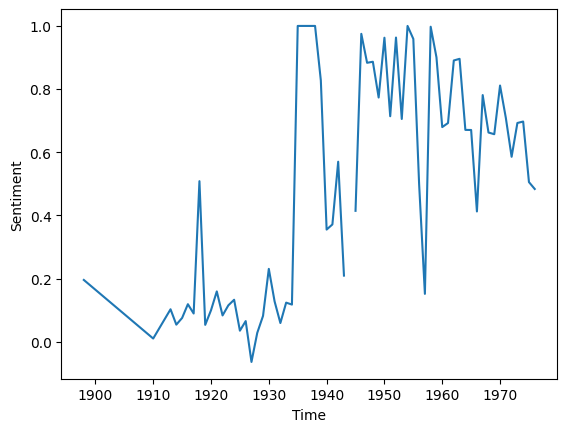

In [24]:
##plot the relationship between two variables
#clean up the dates column to get a single year
cybernetics_data['year'] = cybernetics_data['Date'].str.split('-|\|\|').str.get(0)
cybernetics_data['year'] = cybernetics_data['year'].str.replace(r'[^0-9]', '', regex=True)

# 2. Group by 'Year' and calculate the mean of 'Value'
average_by_year = cybernetics_data.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()

# x = pd.to_numeric(cybernetics_data['year'])
# y = cybernetics_data['Overall Sentiment (Machine Generated)']
# Create a line plot

x = pd.to_numeric(average_by_year['year'])
y = average_by_year['Overall Sentiment (Machine Generated)']
plt.plot(x, y)

# Add labels and a title
plt.xlabel("Time")
plt.ylabel("Sentiment")

# Display the plot
plt.show()

In [22]:
# 2. Group by 'Year' and calculate the mean of 'Value'
average_by_year = cybernetics_data.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()

# The 'average_by_year' DataFrame now contains the average value for each year
print(average_by_year)

    year  Overall Sentiment (Machine Generated)
0                                      0.092207
1   1898                               0.195784
2   1910                               0.010292
3   1913                               0.102956
4   1914                               0.054286
..   ...                                    ...
62  1972                               0.585715
63  1973                               0.692708
64  1974                               0.697288
65  1975                               0.505579
66  1976                               0.483750

[67 rows x 2 columns]


In [32]:
## by creator
# Group by 'Category', get the size of each group, and sort by size in descending order
sorted_by_count = cybernetics_data.groupby('Creator').size().sort_values(ascending=False)

print("\nCategories sorted by count (descending):")
print(sorted_by_count)


Categories sorted by count (descending):
Creator
Ashby, W. Ross (William Ross)                          27
Wiener, Norbert                                        13
McCulloch, Warren S.                                   10
von Foerster, Heinz                                     8
G√ºnther, Gotthard                                      5
                                                       ..
von Foerster, Heinz||Weigand, Karl. H.                  1
von Foerster, Heinz||White, John                        1
von Foerster, Heinz||Wildhagen, Arthur R.               1
von Foerster, Heinz||Yoshida, Susumu||Iso, Yasoyuki     1
Adamson, V.T.||McCulloch, Warren S.                     1
Length: 532, dtype: int64


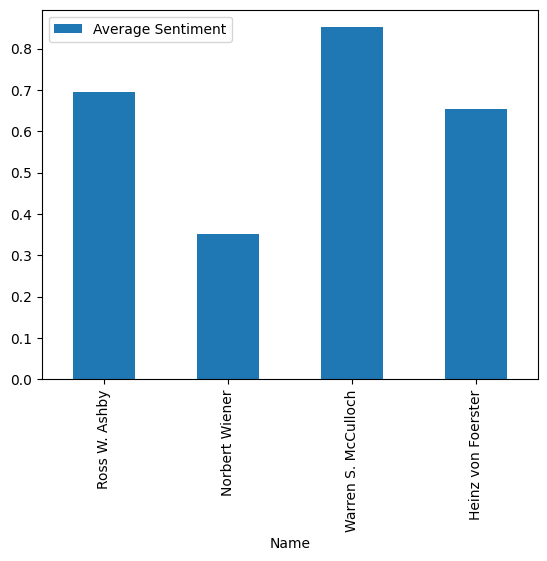

In [37]:
ashby_df = cybernetics_data[cybernetics_data['Creator'].str.contains('Ashby, W. Ross', na=False)]
wiener_df = cybernetics_data[cybernetics_data['Creator'].str.contains('Wiener, Norbert', na=False)]
mcculloch_df = cybernetics_data[cybernetics_data['Creator'].str.contains('McCulloch, Warren S.', na=False)]
vonfoerster_df = cybernetics_data[cybernetics_data['Creator'].str.contains('von Foerster, Heinz', na=False)]

data = {
    'Name': ['Ross W. Ashby', 'Norbert Wiener', 'Warren S. McCulloch', 'Heinz von Foerster'],
    'Average Sentiment': [ashby_df['Overall Sentiment (Machine Generated)'].mean(), 
                          wiener_df['Overall Sentiment (Machine Generated)'].mean(), 
                          mcculloch_df['Overall Sentiment (Machine Generated)'].mean(), 
                          vonfoerster_df['Overall Sentiment (Machine Generated)'].mean()],
}
creator_df = pd.DataFrame(data)
creator_df.plot.bar(x='Name', y='Average Sentiment')
plt.show()

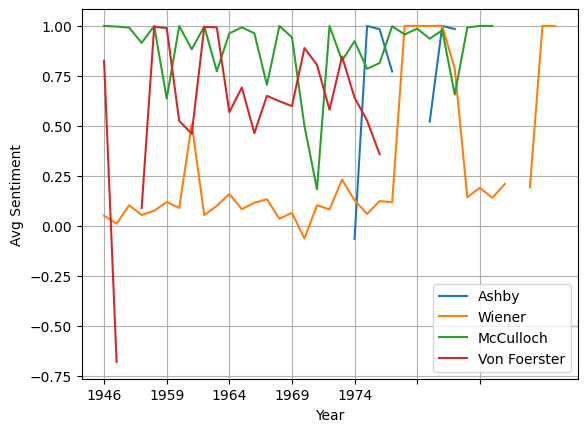

In [39]:
## creator by year

ashby_avg = ashby_df.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()
wiener_avg = wiener_df.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()
mcculloch_avg = mcculloch_df.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()
vonfoerster_avg = vonfoerster_df.groupby('year')['Overall Sentiment (Machine Generated)'].mean().reset_index()

ax = ashby_avg.plot(x='year', y='Overall Sentiment (Machine Generated)', label='Ashby')
wiener_avg.plot(x='year', y='Overall Sentiment (Machine Generated)', label='Wiener', ax=ax)
mcculloch_avg.plot(x='year', y='Overall Sentiment (Machine Generated)', label='McCulloch', ax=ax)
vonfoerster_avg.plot(x='year', y='Overall Sentiment (Machine Generated)', label='Von Foerster', ax=ax)

plt.xlabel('Year')
plt.ylabel('Avg Sentiment')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
##one topic over time



In [76]:
##make a network
# edges_df has 'Source', 'Target', and 'Weight' columns
column_names = ['Source', 'Target', 'Weight']
edges_df = pd.DataFrame(columns=column_names)

##list all the creators
creator_list = []
for i in cybernetics_data['Creator']:
    if not pd.isna(i):
        creator_list.append(i.split('||'))

##turn every creator into pairs
new_creator_list=[]
for entry in creator_list:
    if len(entry)==2:
        new_creator_list.append(entry)
    elif len(entry)>2:
        for combination in itertools.combinations(entry, 2):
            new_creator_list.append(list(combination))

new_creator_list


[['von Foerster, Heinz', 'Inselberg, Alfred'],
 ['von Foerster, Heinz', 'Pask, Gordon'],
 ['Russell, John K.', 'Ashby, W. Ross (William Ross)'],
 ['Uribe, Ricardo B.', 'Maturana, Humberto R.'],
 ['Uribe, Ricardo B.', 'Varela, Francisco'],
 ['Maturana, Humberto R.', 'Varela, Francisco'],
 ['Ficken, Janet', 'von Foerster, Heinz'],
 ['Ginsberg, Robert', 'von Foerster, Heinz'],
 ['Olson, Robert', 'Hoover, Paul'],
 ['Olson, Robert', 'Hess, Karl'],
 ['Olson, Robert', 'von Foerster, Heinz'],
 ['Hoover, Paul', 'Hess, Karl'],
 ['Hoover, Paul', 'von Foerster, Heinz'],
 ['Hess, Karl', 'von Foerster, Heinz'],
 ['von Foerster, Heinz', 'Floyd, Robert W.'],
 ['Head, Eileen', 'von Foerster, Heinz'],
 ['Fullerton, Gail', 'von Foerster, Heinz'],
 ['von Foerster, Heinz', 'Goguen, Joe'],
 ['Gaburo, Kenneth', 'von Foerster, Heinz'],
 ['Geyer, Felix', 'von Foerster, Heinz'],
 ['Gruberg, Edward', 'von Foerster, Heinz'],
 ['von Foerster, Heinz', 'Glanville, Ranulph'],
 ['G√ºnther, Gotthard', 'von Foerster, He

In [94]:
data_series = pd.Series(new_creator_list)

# Calculate the frequency of each unique value
frequency_table = data_series.value_counts().reset_index()

# Display the frequency table
frequency_table

for row in range(len(frequency_table)):
    edges_df.at[row, 'Source'] = frequency_table['index'][row][0]
    edges_df.at[row, 'Target'] = frequency_table['index'][row][1]
    edges_df.at[row, 'Weight'] = frequency_table[0][row]

edges_df


,Source,Target,Weight
0,"Veblen, Oswald","Wiener, Norbert",12
1,"Jordan, E.C.","von Foerster, Heinz",10
2,"Wiener, Leo","Wiener, Norbert",9
3,"Bush, Vannevar","Wiener, Norbert",8
4,"Lee, Y.W.","Wiener, Norbert",8
...,...,...,...
1998,"Mead, Margaret","Fremont-Smith, Frank",1
1999,"Maturana, Humberto R.","Varela, Francisco",1
2000,"Bateson, Gregory","Pitts, Walter",1
2001,"Bateson, Gregory","Wiener, Norbert",1


In [110]:

#make an undirected graph
G = nx.Graph()

#add nodes

G.add_nodes_from(list(creator_set))

#add edges
# Assuming edges_df has 'Source', 'Target', and 'Weight' columns
G = nx.from_pandas_edgelist(edges_df, source='Source', target='Target', edge_attr='Weight')

nx.write_gexf(G, "cyber_network.gexf")

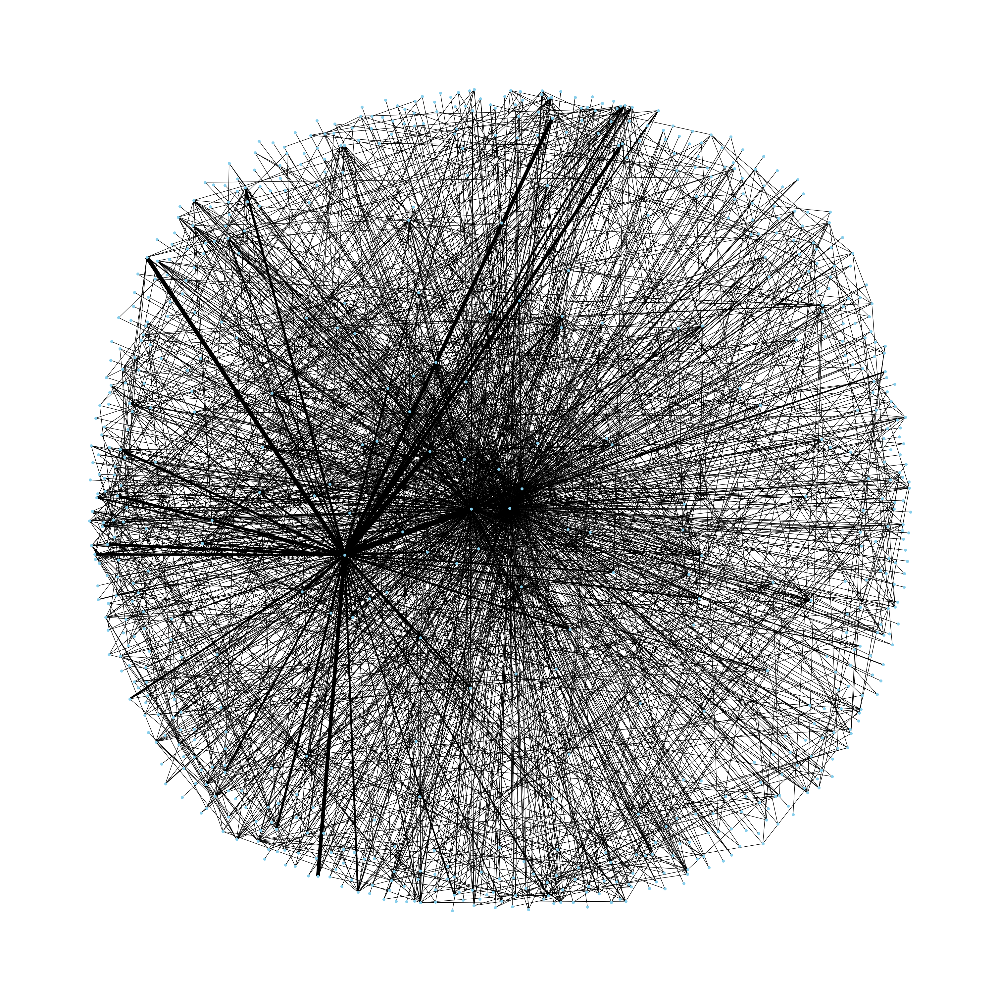

In [109]:
pos = nx.spring_layout(G, k=1)

plt.rcParams["figure.figsize"] = [30, 30]  # 10 inches wide, 7 inches tall
nx.draw(G, pos, width=edges_df['Weight'], with_labels=False, node_color='skyblue', node_size=30, font_size=9)
plt.show()

In [101]:
  pip install Cython

  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'forceatlas2' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'forceatlas2'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Created wheel for forceatlas2: filename=forceatlas2-1.0-py3-none-any.whl size=6544 sha256=9d178fb26b97ae21ffd8dce24356eada5c991a6d48944086b1822a89b3022828
  Stored in directory: /Users/monicamarion/Library/Caches/pip/wheels/b1/45/28/7a67da390e882ee9d35e9f1fb58d091f9bab8f618be3370127
Successfully built forceatlas2

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: /usr/local/opt/python@3.10/bin/python3.10 -m pip install --upgrade pip
Note: you may need t

In [113]:
##add more edge attributes>> time, topic
# if the correspondence was 

for i in range(len(edges_df)):
    print (edges_df.loc[i])

Source     Veblen, Oswald
Target    Wiener, Norbert
Weight                 12
Name: 0, dtype: object
Source           Jordan, E.C.
Target    von Foerster, Heinz
Weight                     10
Name: 1, dtype: object
Source        Wiener, Leo
Target    Wiener, Norbert
Weight                  9
Name: 2, dtype: object
Source     Bush, Vannevar
Target    Wiener, Norbert
Weight                  8
Name: 3, dtype: object
Source          Lee, Y.W.
Target    Wiener, Norbert
Weight                  8
Name: 4, dtype: object
Source        Kline, J.R.
Target    Wiener, Norbert
Weight                  7
Name: 5, dtype: object
Source    von Foerster, Heinz
Target          Ficken, Janet
Weight                      6
Name: 6, dtype: object
Source    Richardson, R.G.D.
Target       Wiener, Norbert
Weight                     6
Name: 7, dtype: object
Source        Swanson, Rowena
Target    von Foerster, Heinz
Weight                      5
Name: 8, dtype: object
Source    von Foerster, Heinz
Target      Inse

In [144]:
##make a network

cybernetics_data['personal'] = cybernetics_data['Classification Certainty (Machine Generated)'].str.extract('(?<=Personal,)\s*([\d.]+)(?=%)')
cybernetics_data['math'] = cybernetics_data['Classification Certainty (Machine Generated)'].str.extract('(?<=Math,)\s*([\d.]+)(?=%)')
cybernetics_data['psychology'] = cybernetics_data['Classification Certainty (Machine Generated)'].str.extract('(?<=Psychology,)\s*([\d.]+)(?=%)')
cybernetics_data['machines'] = cybernetics_data['Classification Certainty (Machine Generated)'].str.extract('(?<=Machines,)\s*([\d.]+)(?=%)')

cybernetics_data['year'] = cybernetics_data['Date'].str.split('-|\|\|').str.get(0)
cybernetics_data['year'] = cybernetics_data['year'].str.replace(r'[^0-9]', '', regex=True)
cybernetics_data['year'] = pd.to_numeric(cybernetics_data['year'])

##remove all creators nan
cybernetics_data = cybernetics_data.dropna(subset=['Creator']).reset_index(drop=True)


In [145]:
# edges_df has 'Source', 'Target', 'Weight', 'Years', 'Personal','Math','Psychology','Machines' 
column_names = ['Source', 'Target', 'Year', 'Personal','Math','Psychology','Machines']
all_edges_df = pd.DataFrame(columns=column_names)

# for every row in the main df, make a row for each pair
for row in range(len(cybernetics_data)):
    creator_list = cybernetics_data.at[row, 'Creator'].split('||')
    if len(creator_list) == 2:
        source = creator_list[0]
        target = creator_list[1]
        year = cybernetics_data.at[row, 'year']
        personal = cybernetics_data.at[row, 'personal']
        math = cybernetics_data.at[row, 'math']
        psychology = cybernetics_data.at[row, 'psychology']
        machines = cybernetics_data.at[row, 'machines']
        all_edges_df.loc[len(all_edges_df)] = [source, target, year, personal, math, psychology, machines]
    elif len(creator_list)>2:
        for combination in itertools.combinations(creator_list, 2):
            source = combination[0]
            target = combination[1]
            year = cybernetics_data.at[row, 'year']
            personal = cybernetics_data.at[row, 'personal']
            math = cybernetics_data.at[row, 'math']
            psychology = cybernetics_data.at[row, 'psychology']
            machines = cybernetics_data.at[row, 'machines']
            all_edges_df.loc[len(all_edges_df)] = [source, target, year, personal, math, psychology, machines]

all_edges_df


,Source,Target,Year,Personal,Math,Psychology,Machines
0,"von Foerster, Heinz","Inselberg, Alfred",1962.0,99.96,0.04,0.00,0.00
1,"von Foerster, Heinz","Pask, Gordon",1960.0,100.00,0.00,0.00,0.00
2,"Russell, John K.","Ashby, W. Ross (William Ross)",1963.0,99.99,0.01,0.00,0.00
3,"Uribe, Ricardo B.","Maturana, Humberto R.",1974.0,82.48,0.00,17.52,0.00
4,"Uribe, Ricardo B.","Varela, Francisco",1974.0,82.48,0.00,17.52,0.00
...,...,...,...,...,...,...,...
2217,"Einstein, Albert","Turing, Alan",1946.0,99.99,0.01,0.00,0.00
2218,"Einstein, Albert","McCulloch, Warren S.",1946.0,99.99,0.01,0.00,0.00
2219,"Carnap, Rudolf","Turing, Alan",1946.0,99.99,0.01,0.00,0.00
2220,"Carnap, Rudolf","McCulloch, Warren S.",1946.0,99.99,0.01,0.00,0.00


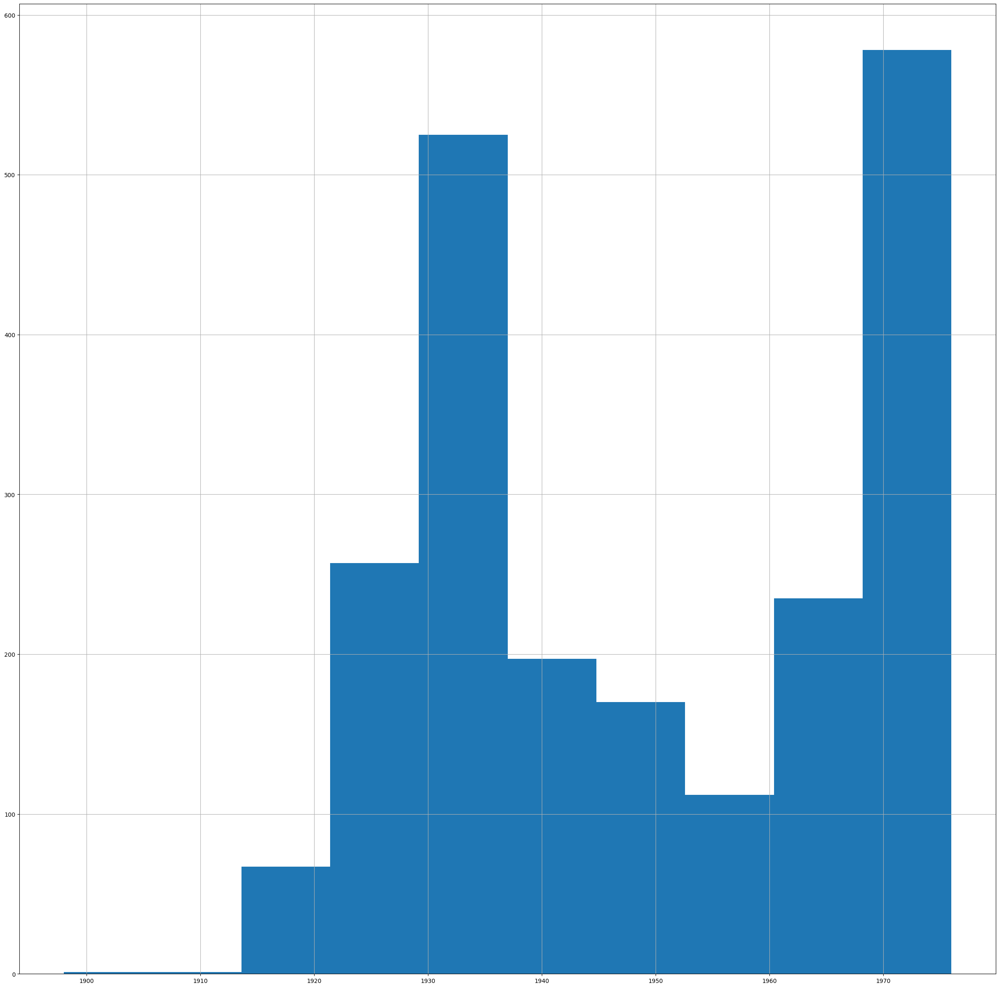

In [147]:
all_edges_df['Year'].hist()
plt.show()


In [149]:
from IPython.display import clear_output
import time # for demonstration purposes

In [153]:
##new plan- we draw a different network for every year and just calculate a chance that that news gets mentioned
##each step we update: year, letters written, new people informed, % of network that knows about it

##version 1: a flat percentage chance

news_index = .8
    ##choose a seed that's one of our four main guys
seed_nodes = ['Ashby, W. Ross', 'Wiener, Norbert', 'McCulloch, Warren S.','von Foerster, Heinz']

seed = random.choice(seed_nodes)

for year in range (1920, 1975):
    clear_output(wait=True)
    print (year)
    print (all_edges_df.loc[all_edges_df['Year'] == year,['Source','Target']])
    time.sleep(1) # Simulate some work
    

1928
                  Source            Target
1105  Richardson, R.G.D.  Birkhoff, George
1106  Richardson, R.G.D.     Rainich, G.Y.
1107  Richardson, R.G.D.    Van Dine, S.S.
1108  Richardson, R.G.D.  Caratheodory, C.
1109  Richardson, R.G.D.     Daniell, P.J.
1110  Richardson, R.G.D.    Veblen, Oswald
1111  Richardson, R.G.D.       Hilbert, D.
1112  Richardson, R.G.D.   Wiener, Norbert
1113  Richardson, R.G.D.       Wiener, Leo
1114    Birkhoff, George     Rainich, G.Y.
1115    Birkhoff, George    Van Dine, S.S.
1116    Birkhoff, George  Caratheodory, C.
1117    Birkhoff, George     Daniell, P.J.
1118    Birkhoff, George    Veblen, Oswald
1119    Birkhoff, George       Hilbert, D.
1120    Birkhoff, George   Wiener, Norbert
1121    Birkhoff, George       Wiener, Leo
1122       Rainich, G.Y.    Van Dine, S.S.
1123       Rainich, G.Y.  Caratheodory, C.
1124       Rainich, G.Y.     Daniell, P.J.
1125       Rainich, G.Y.    Veblen, Oswald
1126       Rainich, G.Y.       Hilbert, D.
1127  

KeyboardInterrupt: 

In [180]:
##new plan- we draw a different network for every year and just calculate a chance that that news gets mentioned
##each step we update: year, letters written, new people informed, % of network that knows about it

##version 1: a flat percentage chance

news_index = .8
    ##choose a seed that's one of our four main guys
seed_nodes = ['Ashby, W. Ross', 'Wiener, Norbert', 'McCulloch, Warren S.','von Foerster, Heinz']

seed = random.choice(seed_nodes)
in_the_know = [seed]

all_nodes = all_edges_df['Source'].tolist() + all_edges_df['Target'].tolist()
all_nodes = list(set(all_nodes))

start_year = 1920
end_year = 1975

for year in range (start_year, end_year):
    clear_output(wait=True)
    print (seed)
    print (year)
    #if any of those letters (all_edges_df.loc[all_edges_df['Year'] == year,['Source','Target']]) includes someone in_the_know
    letters_links = all_edges_df.loc[all_edges_df['Year'] == year].reset_index(drop=True)
    #make list of 
    for row in range(len(letters_links)):
        ##check if in the know
        source = letters_links.at[row,'Source']
        target = letters_links.at[row,'Target']
        new_folk = []
        if (source in in_the_know):
            delivery_chance = random.uniform(0, 1)
            if delivery_chance < news_index:
            #add the new person to in the know and print them    
                in_the_know.append (target)
                new_folk.append(target)
        elif (target in in_the_know):
            delivery_chance = random.uniform(0, 1)
            if delivery_chance < news_index:
            #add the new person to in the know and print them    
                in_the_know.append (source)
                new_folk.append(source)      

    #print number of people in the know
    print (len(in_the_know))
    #print percentage of network in the know
    print (len(in_the_know)/len(all_nodes)*100,'%')
    for i in new_folk:
        print (i)

    print (cybernetics_data.loc[cybernetics_data['year'] == year,['Creator']])
    #save no of people and percentage of network in the know in its own dataframe
    
    time.sleep(.5) # Simulate some work
    

McCulloch, Warren S.
1974
674
96.28571428571429 %
Buckley, Walter
                                               Creator
13   Uribe, Ricardo B.||Maturana, Humberto R.||Vare...
22                Gaburo, Kenneth||von Foerster, Heinz
24                   Geyer, Felix||von Foerster, Heinz
26             von Foerster, Heinz||Glanville, Ranulph
31   von Foerster, Heinz||Letelier, Gloria||Beer, S...
40                Fischer, Roland||von Foerster, Heinz
64                 von Foerster, Heinz||Mead, Margaret
79              von Foerster, Heinz||Michael, Patricia
86               Mendius, Barbara||von Foerster, Heinz
99              von Foerster, Heinz||Leretaille, Louis
101       Dolge, Jonathan||Lilly, Toni||Lilly, John C.
104                                      Lauzzana, Ray
106                                    Lorenz, Gilbert
136                 von Foerster, Heinz||Janin, Pierre
151            von Foerster, Heinz||Abbott, Bernard C.
159  Archibald, Kathleen A.||Howe, Richard H.||von ...

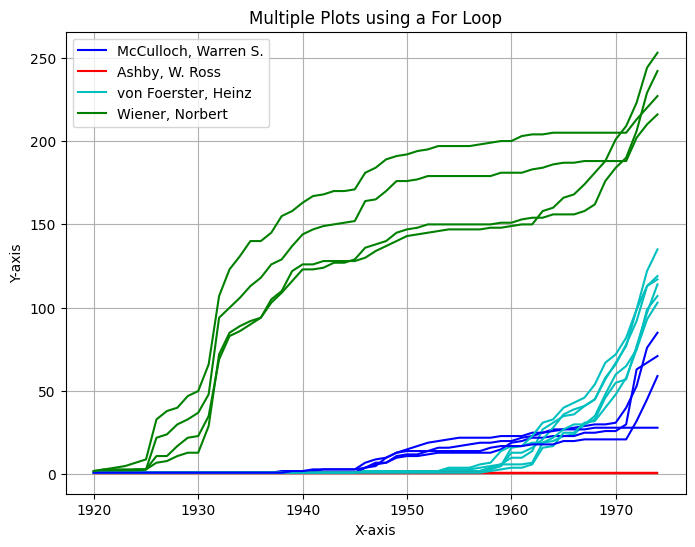

In [194]:
##run the simulation X times and make a line chart
trials = 20

##new plan- we draw a different network for every year and just calculate a chance that that news gets mentioned
##each step we update: year, letters written, new people informed, % of network that knows about it

##version 1: a flat percentage chance

news_index = .2
    ##choose a seed that's one of our four main guys
seed_nodes = ['Ashby, W. Ross', 'Wiener, Norbert', 'McCulloch, Warren S.','von Foerster, Heinz']
colors = ['r', 'g', 'b', 'c']

all_nodes = all_edges_df['Source'].tolist() + all_edges_df['Target'].tolist()
all_nodes = list(set(all_nodes))

start_year = 1920
end_year = 1975

plt.figure(figsize=(8, 6)) # Create a single figure

for trial in range (trials):
    seed_choice = random.randint(0, 3)
    seed = seed_nodes[seed_choice]
    in_the_know = [seed]

    column_names = ['year', 'no_people', 'percentage']
    trial_df = pd.DataFrame(columns=column_names)
    trial_df['year'] = range (start_year, end_year)
    no_people_peryr = []
    percentage_peryr = []
    for year in range (start_year, end_year):

        #if any of those letters (all_edges_df.loc[all_edges_df['Year'] == year,['Source','Target']]) includes someone in_the_know
        letters_links = all_edges_df.loc[all_edges_df['Year'] == year].reset_index(drop=True)
        #make list of 
        for row in range(len(letters_links)):
            ##check if in the know
            source = letters_links.at[row,'Source']
            target = letters_links.at[row,'Target']
            if (source in in_the_know):
                delivery_chance = random.uniform(0, 1)
                if delivery_chance < news_index:
                #add the new person to in the know and print them    
                    in_the_know.append (target)
            elif (target in in_the_know):
                delivery_chance = random.uniform(0, 1)
                if delivery_chance < news_index:
                #add the new person to in the know and print them    
                    in_the_know.append (source)
    
        #number of people in the know
        no_people_peryr.append(len(in_the_know))
        #percentage of network in the know
        percentage_peryr.append(len(in_the_know)/len(all_nodes)*100)
    
    #save no of people and percentage of network in the know in its own dataframe
    trial_df['no_people'] = no_people_peryr
    trial_df['percentage'] = percentage_peryr

    plt.plot(trial_df['year'], trial_df['no_people'], color=colors[seed_choice], label = seed)

plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Multiple Plots using a For Loop")
plt.legend()

# Get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

# Create a dictionary to remove duplicates
by_label = dict(zip(labels, handles))

# Generate the legend with unique entries
plt.legend(by_label.values(), by_label.keys())

plt.grid(True)
plt.show()

In [ ]:
#run it again but with subject matter specified

In [ ]:
## run it again with just wiener, varying the parameter, looking for 